##### Copyright 2018 The TensorFlow Hub Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [0]:
# Copyright 2018 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

# Trashspotting - Trained Model Evaluation

## Collection of Tutorials and References to Evaluate Image Recognition Models

### Purpose

Evaluate image recognition models to develop custom model for litter detection in California.

### Problem Statement

Public litter has large environmental, sustainability and livability impacts in California. As a result, this project seeks to help address the issue with data science.

### Introduction

Image recognition project using Google [TensorFlow](https://www.tensorflow.org/), [Colaboratory](https://colab.research.google.com/notebooks/welcome.ipynb) and [Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection).

Each major tutorial is organized into its own notebook module and cited accordingly.

### Image Analysis

This project seeks to implement a custom image recognition model with object detection using TensorFlow. It includes the necessary Jupyter notebooks, Python files and datasets to deploy the model.

### Installation

Clone Github repository, then run locally or with Google Colaboratory. Local installation will require TensorFlow and all dependencies.

### Citations

Code is based on tutorial below; template has been modified to analyze various images containing litter.

# Object detection

<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>


This Colab demonstrates use of a TF-Hub module trained to perform object detection.

## Imports and function definitions


In [2]:
#@title Imports and function definitions

# For running inference on the TF-Hub module.
import tensorflow as tf
import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

The following GPU devices are available: /device:GPU:0


## Example use

### Helper functions for downloading images and for visualization.

Visualization code adapted from [TF object detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py) for the simplest required functionality.

In [0]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = bottom + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i].tolist())
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

## Apply module

Load a public image from Open Images v4, save locally, and display.

Image downloaded to /tmp/tmppt4silsp.jpg.


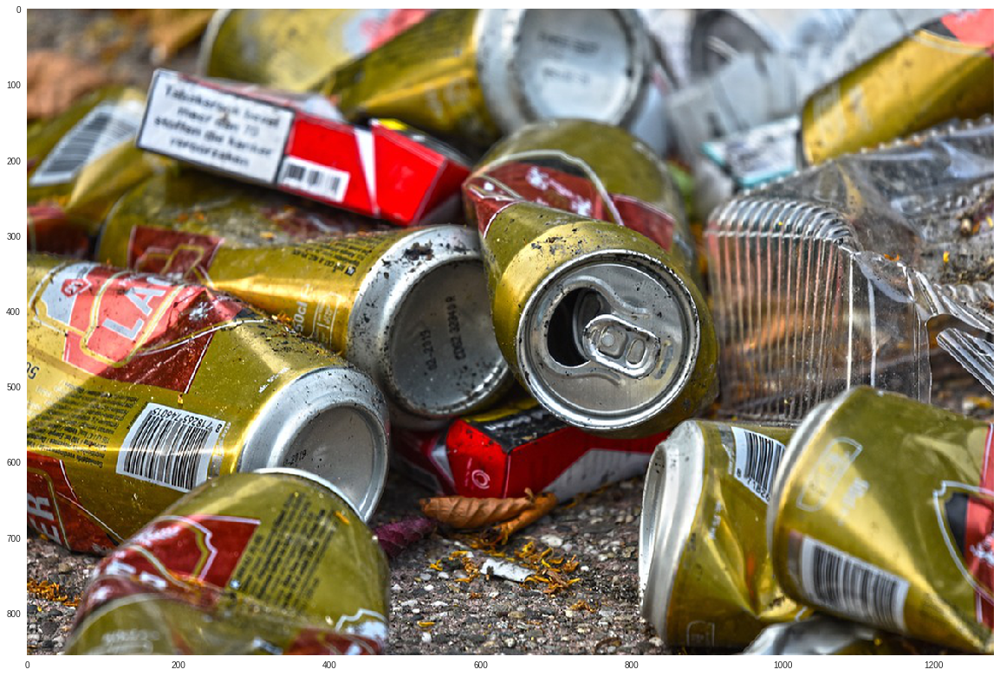

In [4]:
image_url = "https://cdn.pixabay.com/photo/2018/06/22/03/32/can-3489894_960_720.jpg"  #@param
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

Pick an object detection module and apply on the downloaded image. Modules:
* **FasterRCNN+InceptionResNet V2**: high accuracy,
* **ssd+mobilenet V2**: small and fast.

INFO:tensorflow:Using /tmp/tfhub_modules to cache modules.
INFO:tensorflow:Downloading TF-Hub Module 'https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1'.
INFO:tensorflow:Downloaded https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1, Total size: 273.85MB
INFO:tensorflow:Downloaded TF-Hub Module 'https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1'.
INFO:tensorflow:Saver not created because there are no variables in the graph to restore
INFO:tensorflow:Saver not created because there are no variables in the graph to restore
Found 100 objects.


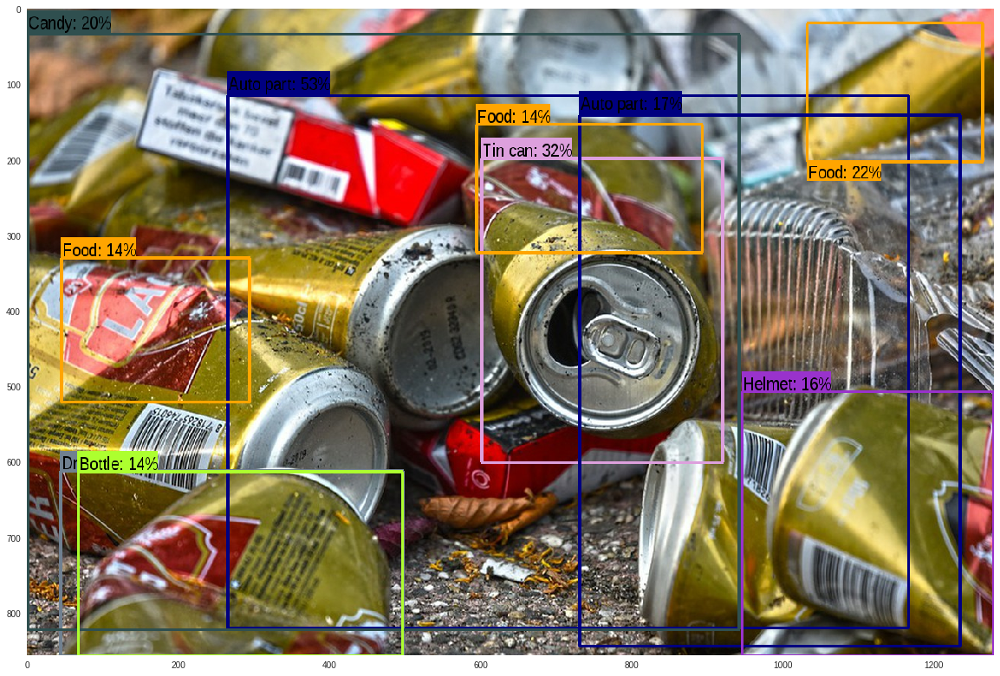

In [5]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" #@param ["https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"]

with tf.Graph().as_default():
  detector = hub.Module(module_handle)
  image_string_placeholder = tf.placeholder(tf.string)
  decoded_image = tf.image.decode_jpeg(image_string_placeholder)
  # Module accepts as input tensors of shape [1, height, width, 3], i.e. batch
  # of size 1 and type tf.float32.
  decoded_image_float = tf.image.convert_image_dtype(
      image=decoded_image, dtype=tf.float32)
  module_input = tf.expand_dims(decoded_image_float, 0)
  result = detector(module_input, as_dict=True)
  init_ops = [tf.global_variables_initializer(), tf.tables_initializer()]

  session = tf.Session()
  session.run(init_ops)

  # Load the downloaded and resized image and feed into the graph.
  with tf.gfile.Open(downloaded_image_path, "rb") as binfile:
    image_string = binfile.read()

  result_out, image_out = session.run(
      [result, decoded_image],
      feed_dict={image_string_placeholder: image_string})
  print("Found %d objects." % len(result_out["detection_scores"]))

image_with_boxes = draw_boxes(
    np.array(image_out), result_out["detection_boxes"],
    result_out["detection_class_entities"], result_out["detection_scores"])

display_image(image_with_boxes)

### More images
Perform inference on some additional images with time tracking.


Image downloaded to /tmp/tmpkefuhs28.jpg.
Found 100 objects.
Inference took 4.46 seconds.
Image downloaded to /tmp/tmpx4onu82v.jpg.
Found 100 objects.
Inference took 1.85 seconds.
Image downloaded to /tmp/tmpkwhe_i36.jpg.
Found 100 objects.
Inference took 1.83 seconds.
Image downloaded to /tmp/tmpaxlbc68v.jpg.
Found 100 objects.
Inference took 1.86 seconds.
Image downloaded to /tmp/tmp_0epl1pn.jpg.
Found 100 objects.
Inference took 1.87 seconds.


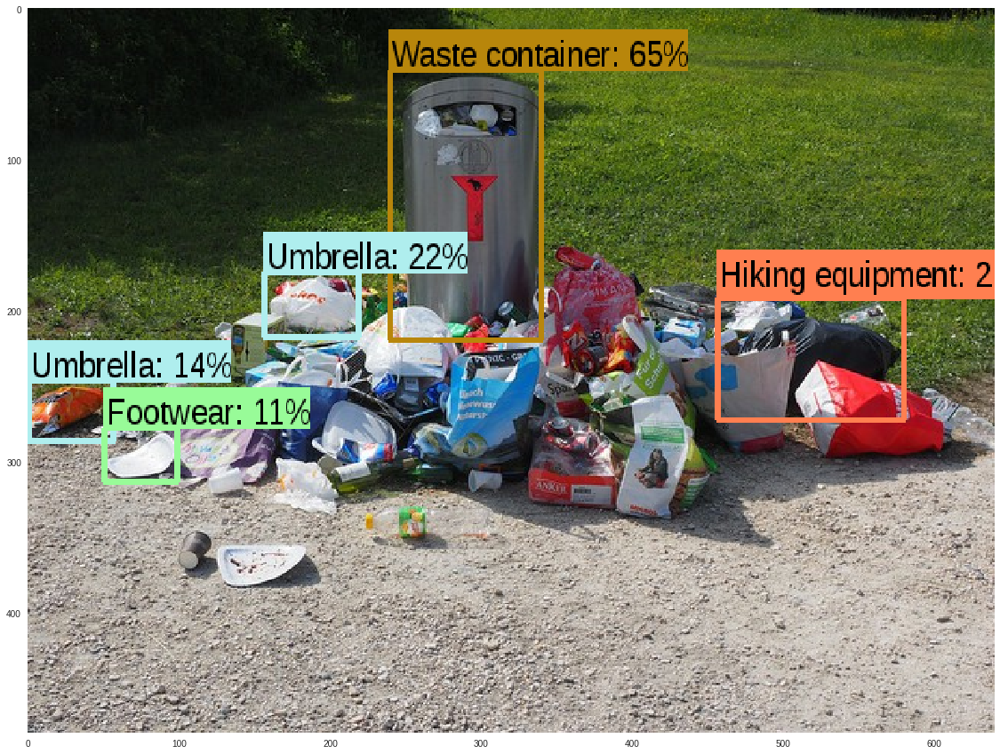

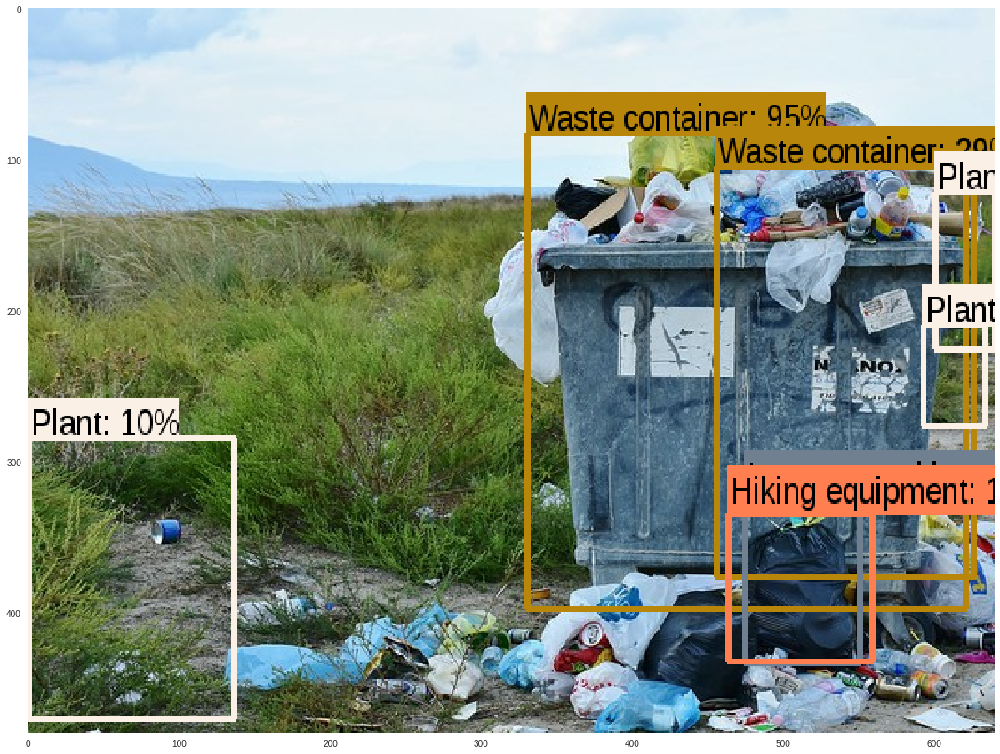

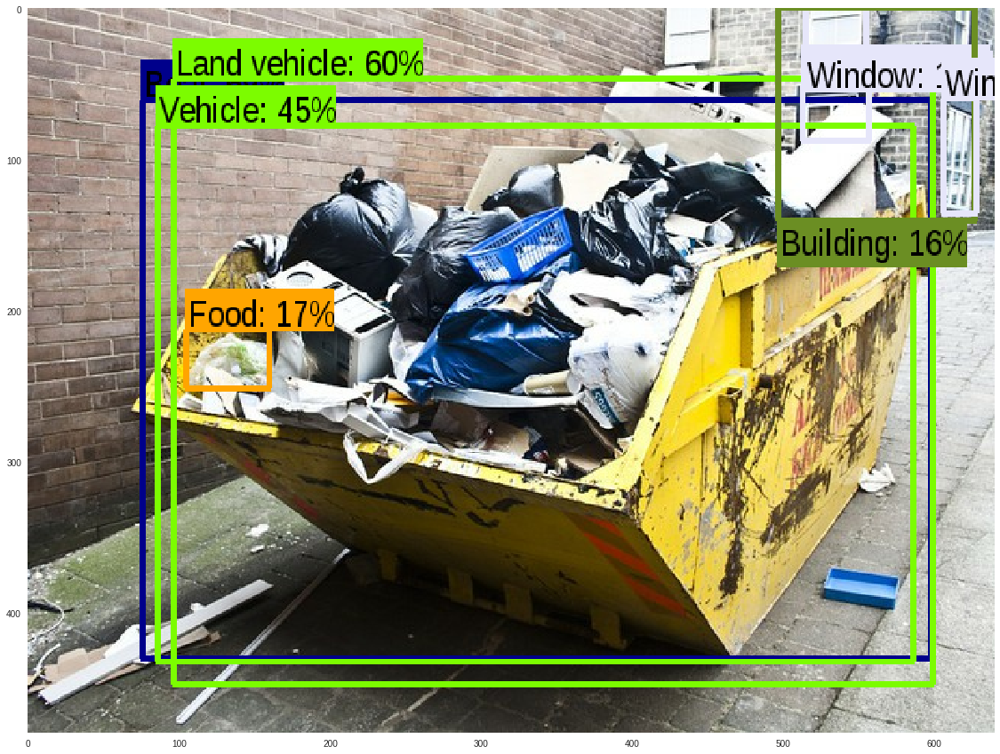

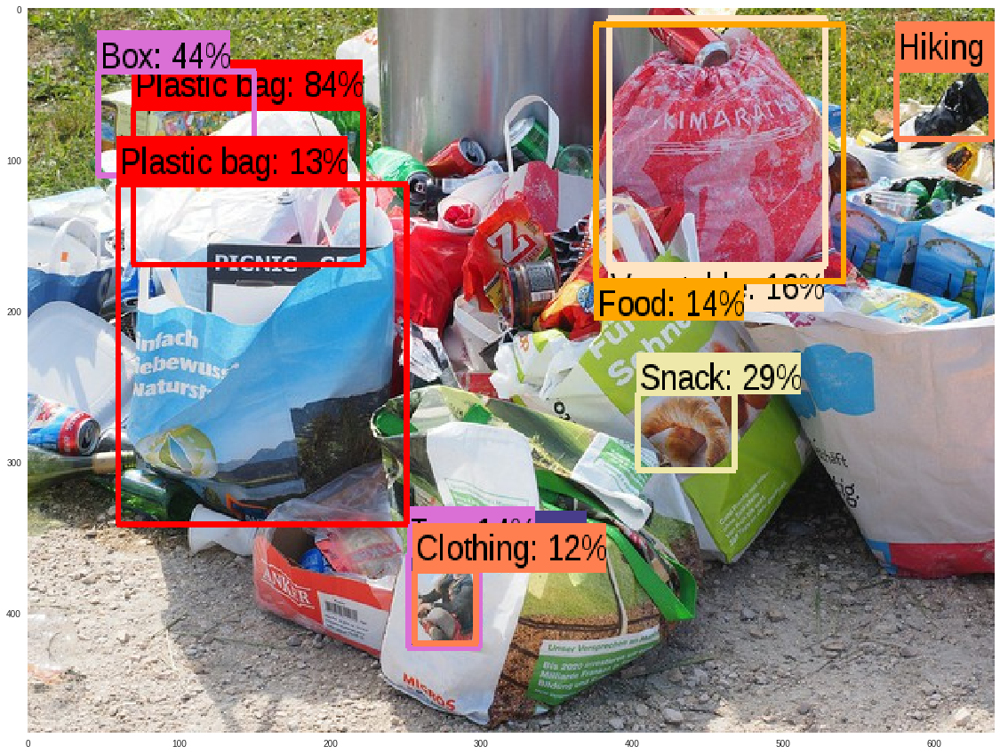

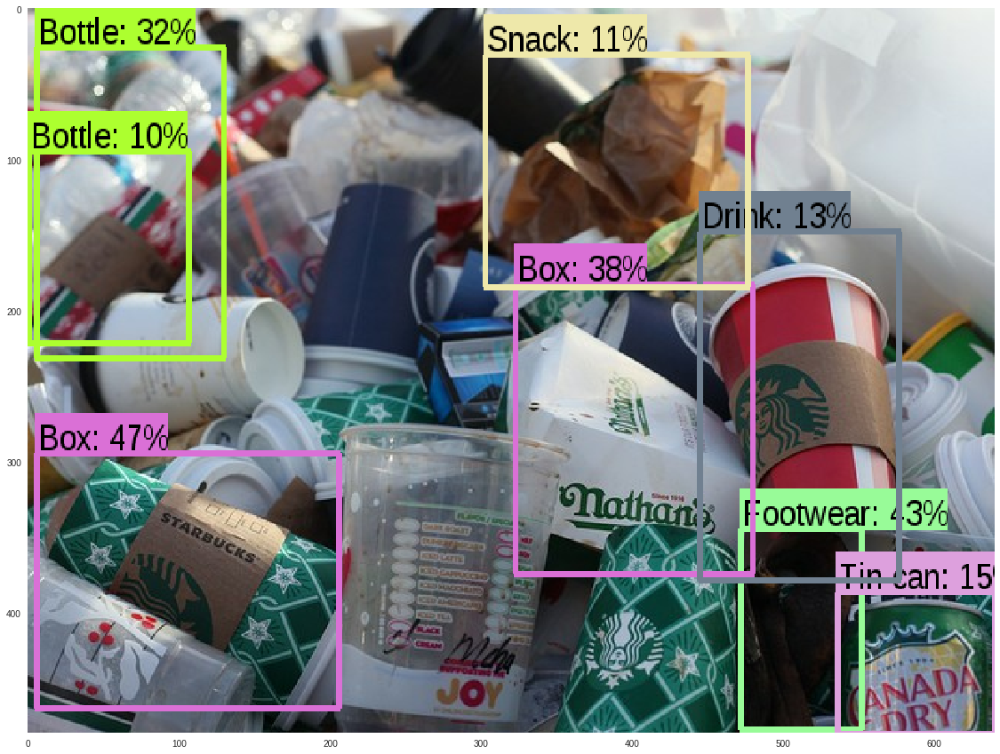

In [6]:
# 15A - Colab GTF Object Detection Template (Object Images)
# Reference: https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb

image_urls = [
  "https://cdn.pixabay.com/photo/2016/03/16/14/12/garbage-can-1260832_960_720.jpg",
  "https://cdn.pixabay.com/photo/2017/09/08/18/20/garbage-2729608_960_720.jpg",
  "https://cdn.pixabay.com/photo/2013/07/05/12/20/rubbish-143465_960_720.jpg",
  "https://cdn.pixabay.com/photo/2016/03/16/14/12/garbage-1260833_960_720.jpg",
  "https://cdn.pixabay.com/photo/2019/01/11/02/39/coffeetogo-3926395_960_720.jpg"
]

for image_url in image_urls:
  image_path = download_and_resize_image(image_url, 640, 480)
  with tf.gfile.Open(image_path, "rb") as binfile:
    image_string = binfile.read()

  inference_start_time = time.clock()
  result_out, image_out = session.run(
      [result, decoded_image],
      feed_dict={image_string_placeholder: image_string})
  print("Found %d objects." % len(result_out["detection_scores"]))
  print("Inference took %.2f seconds." % (time.clock()-inference_start_time))

  image_with_boxes = draw_boxes(
    np.array(image_out), result_out["detection_boxes"],
    result_out["detection_class_entities"], result_out["detection_scores"])

  display_image(image_with_boxes)


Image downloaded to /tmp/tmpvy5kg4ud.jpg.
Found 100 objects.
Inference took 1.85 seconds.
Image downloaded to /tmp/tmp_nseq71s.jpg.
Found 100 objects.
Inference took 1.85 seconds.
Image downloaded to /tmp/tmp39c4rv7l.jpg.
Found 100 objects.
Inference took 1.86 seconds.
Image downloaded to /tmp/tmpqq8gmof1.jpg.
Found 100 objects.
Inference took 1.83 seconds.
Image downloaded to /tmp/tmpvqb9juqy.jpg.
Found 100 objects.
Inference took 1.86 seconds.
Image downloaded to /tmp/tmp7k4qi3ls.jpg.
Found 100 objects.
Inference took 1.90 seconds.
Image downloaded to /tmp/tmp3fc1oyuo.jpg.
Found 100 objects.
Inference took 1.86 seconds.
Image downloaded to /tmp/tmp08wjkp36.jpg.
Found 100 objects.
Inference took 1.83 seconds.
Image downloaded to /tmp/tmpqh2ccm6p.jpg.
Found 100 objects.
Inference took 1.88 seconds.
Image downloaded to /tmp/tmpov4sdnvm.jpg.
Found 100 objects.
Inference took 1.83 seconds.


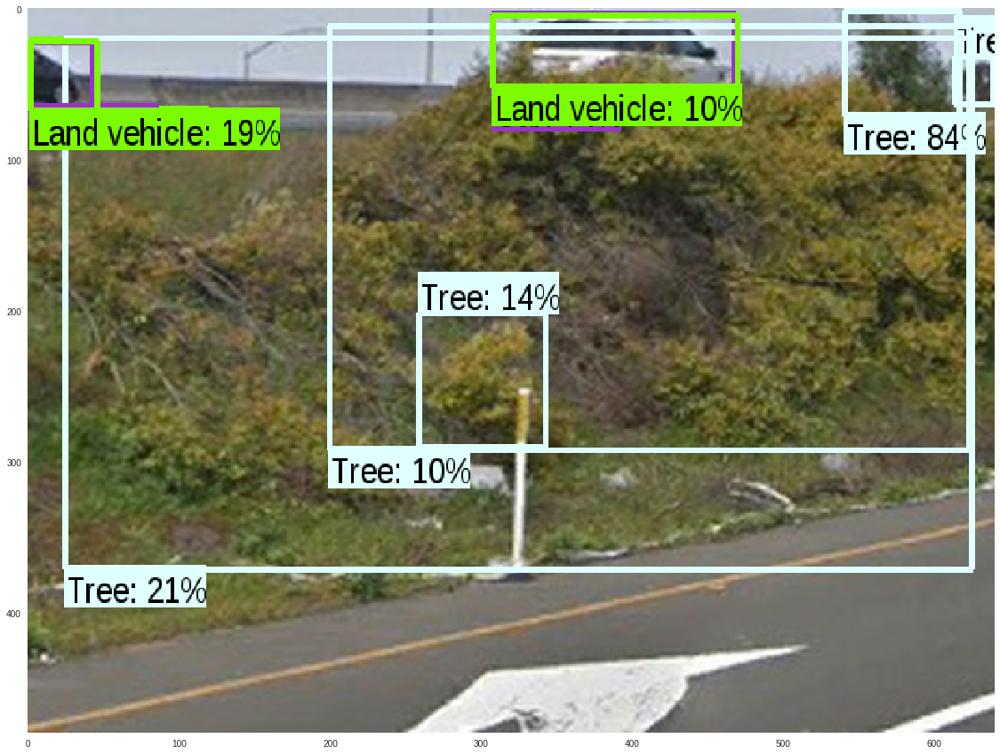

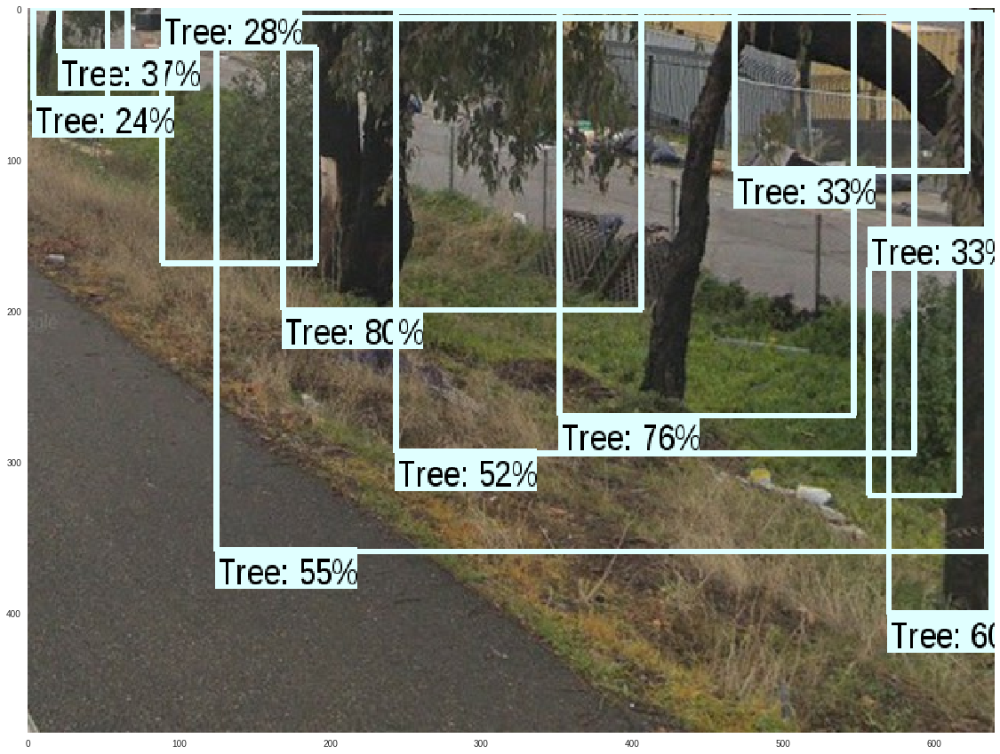

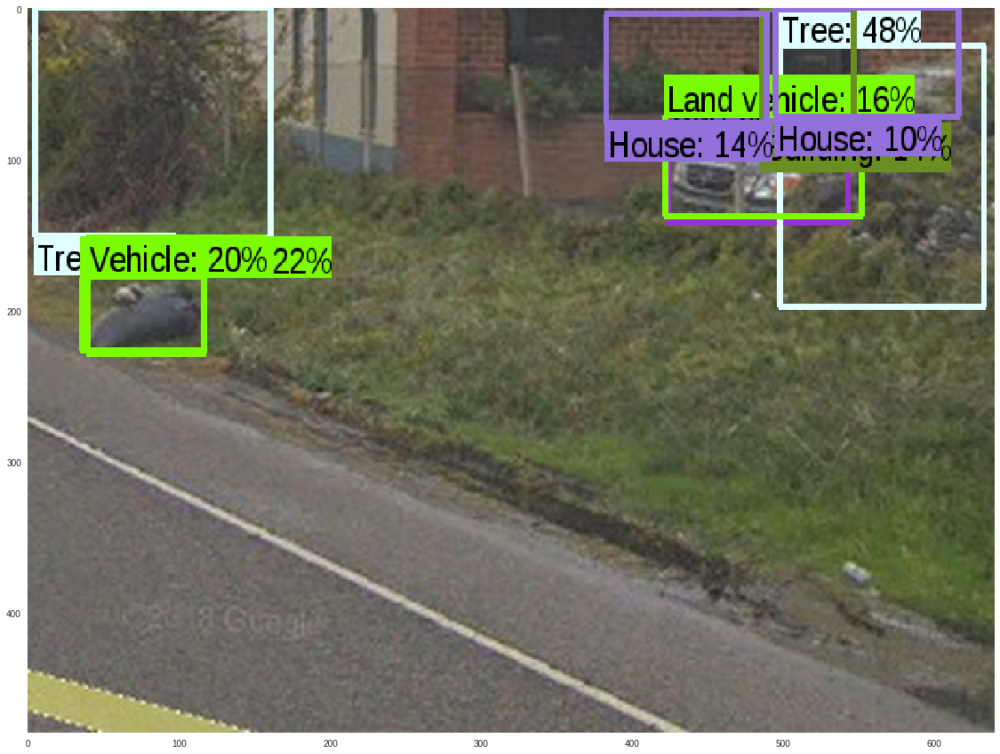

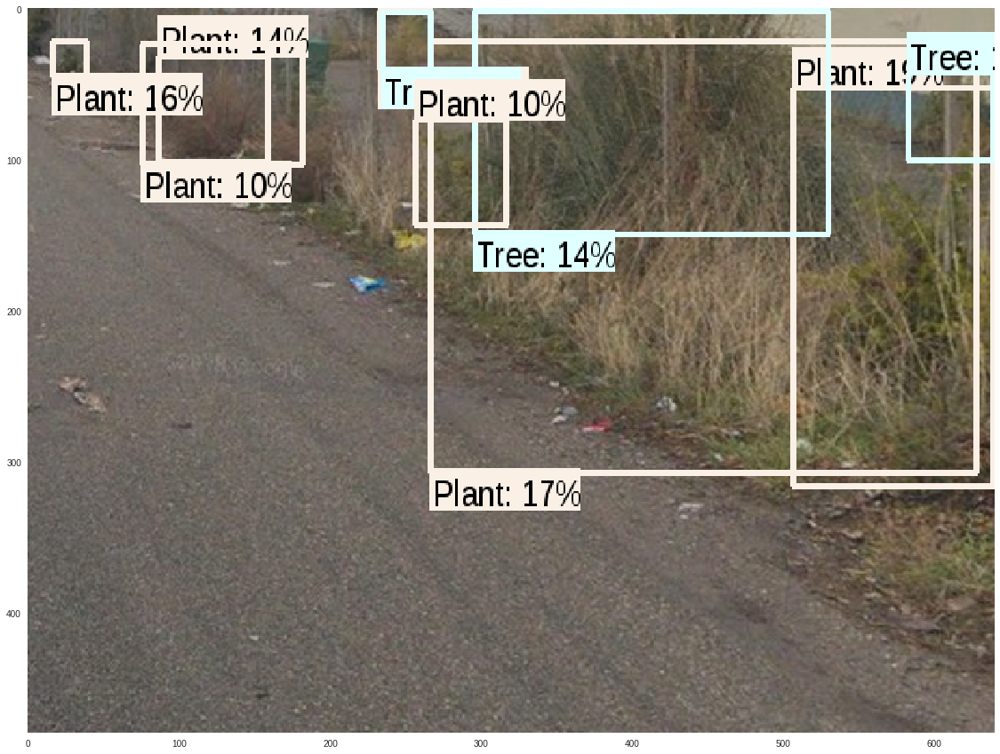

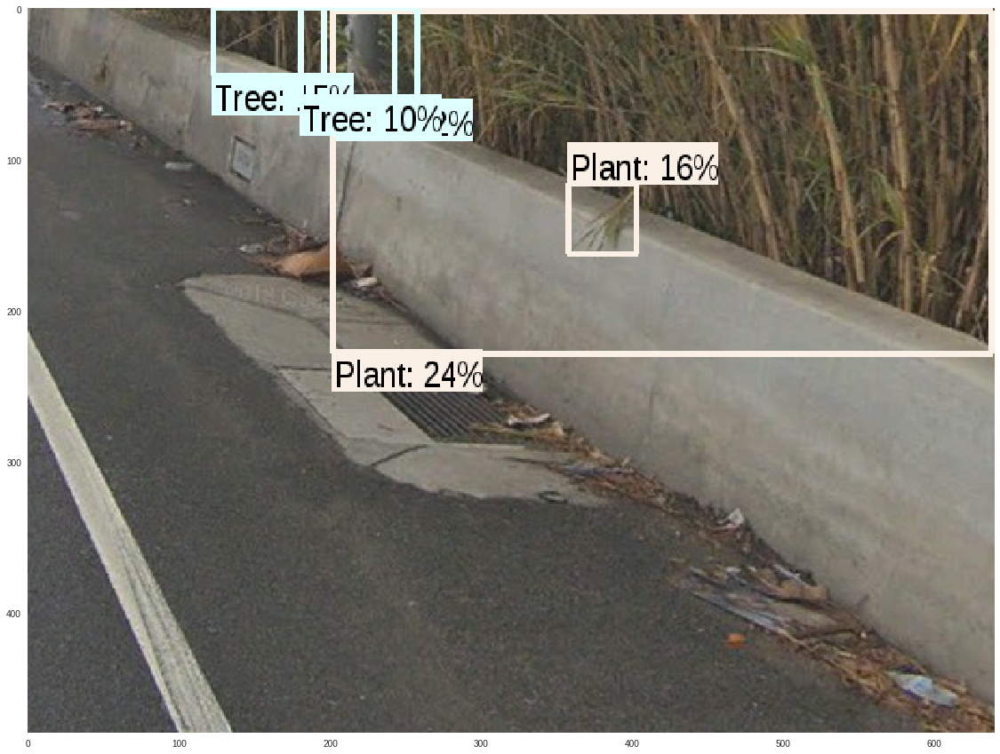

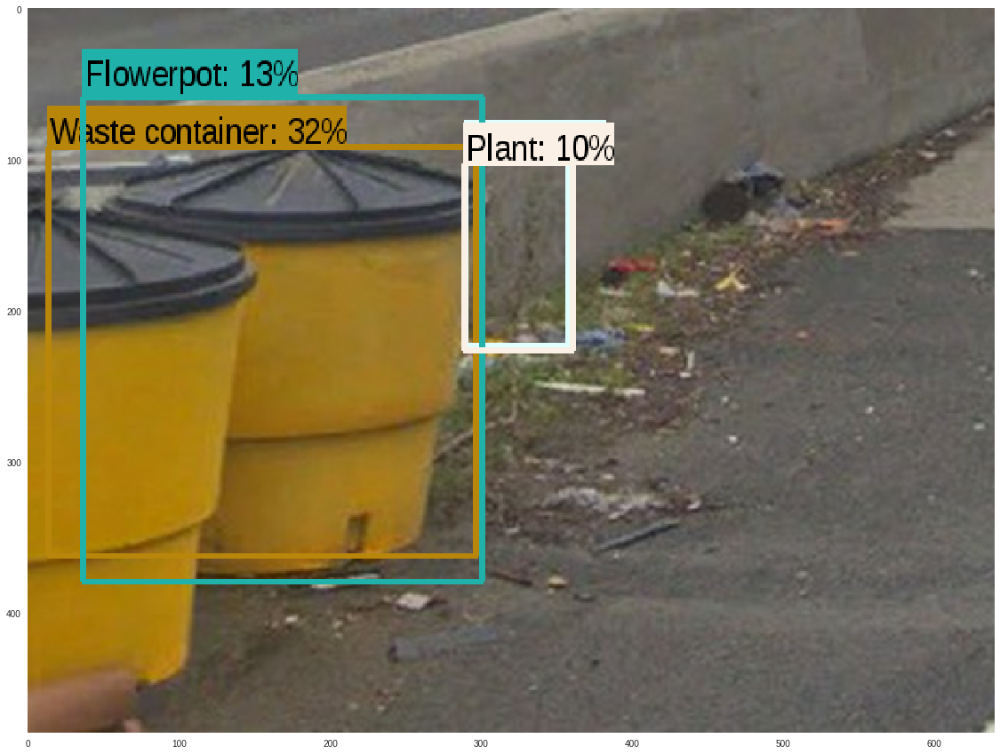

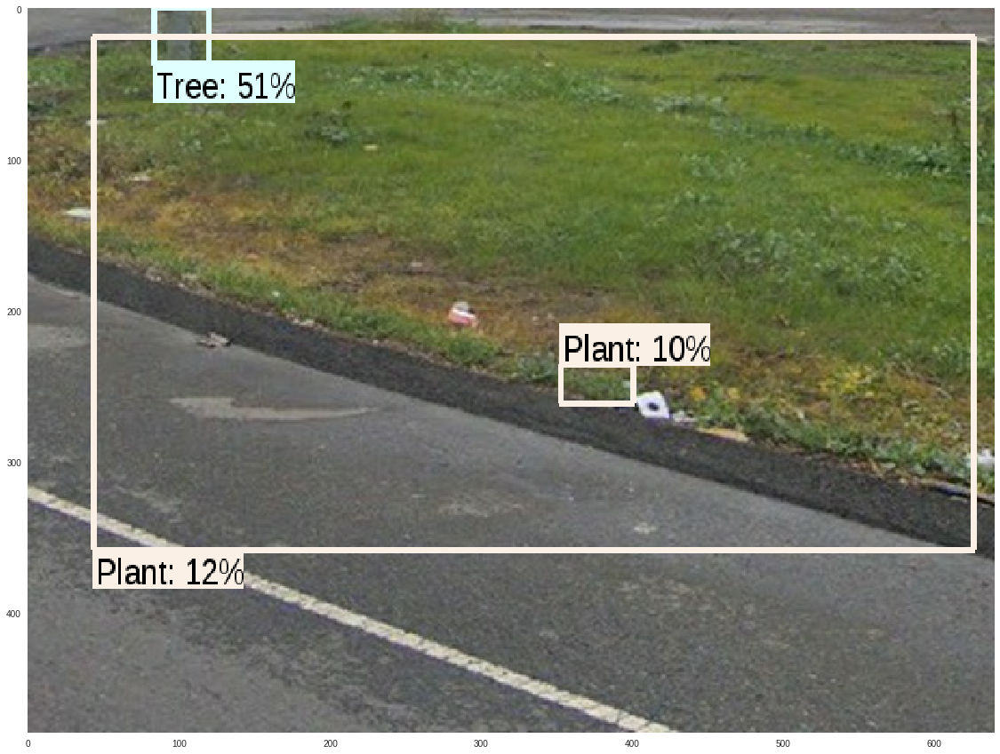

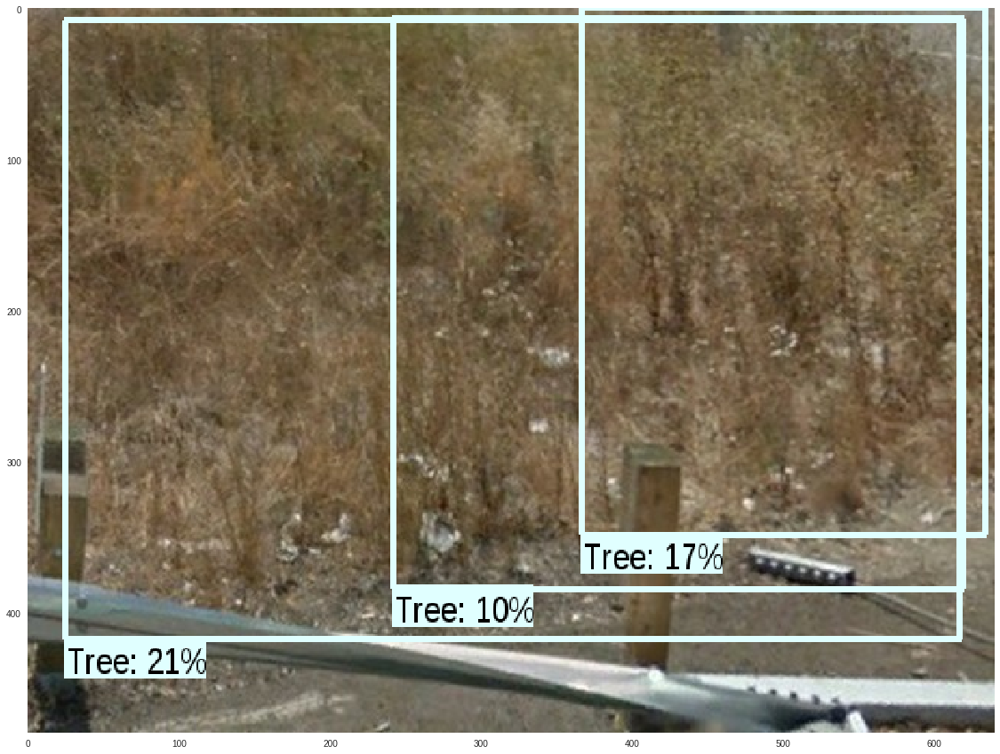

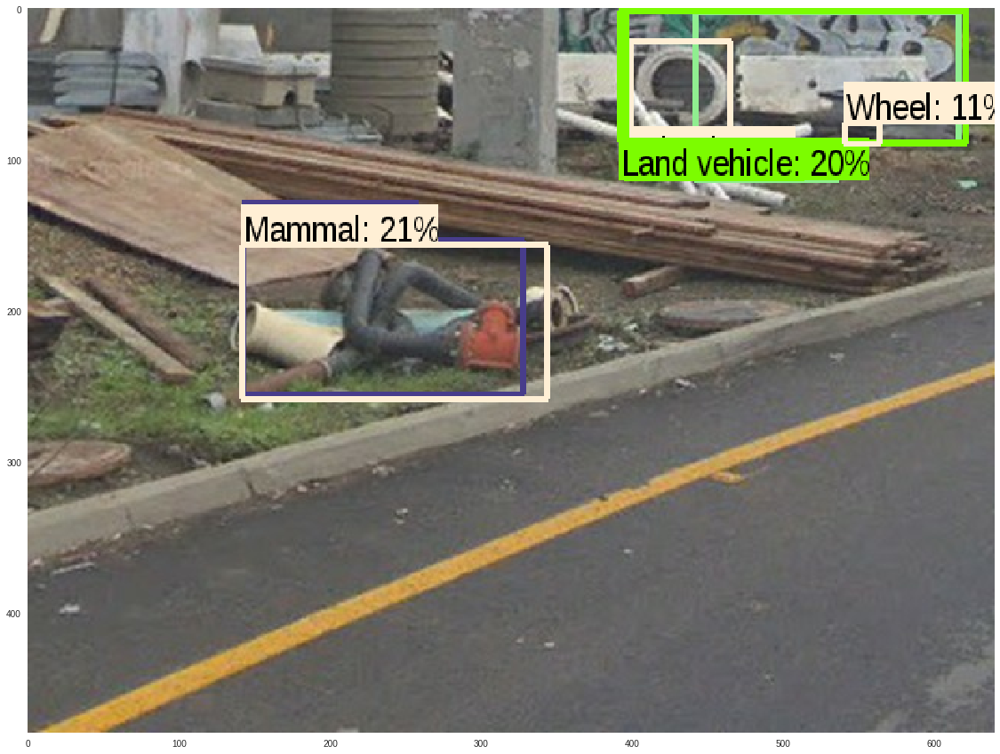

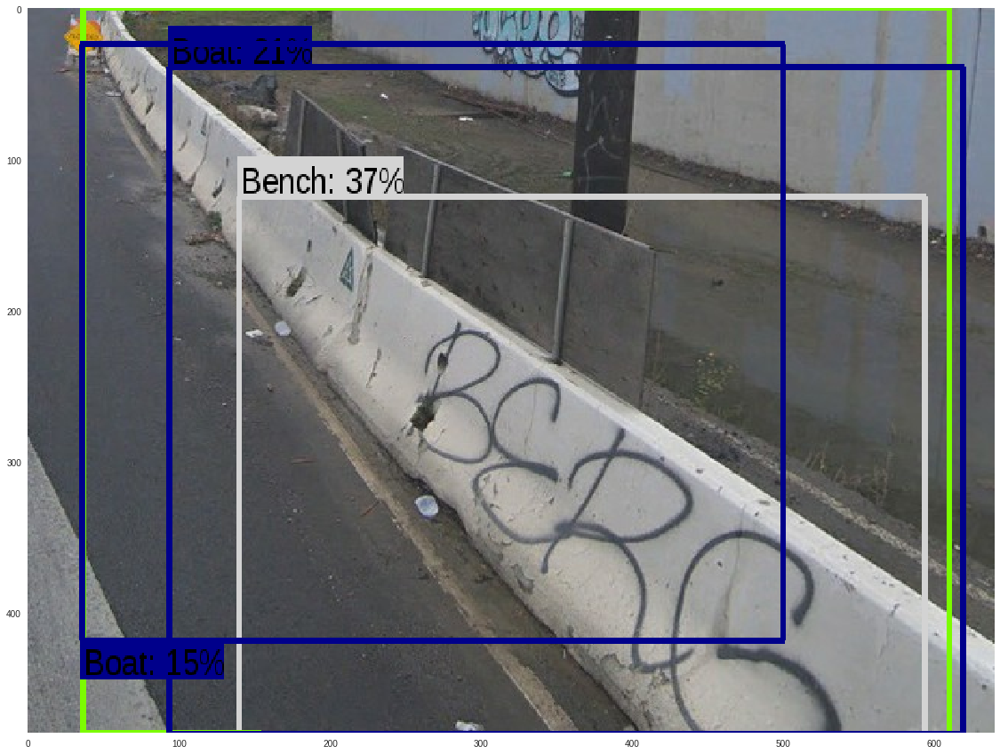

In [7]:
# 15B - Colab GTF Object Detection Template (Highway Images)
# Reference: https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb

image_urls = [
  # trash1.jpg
  "https://drive.google.com/uc?export=view&id=1WBDwpcSfGD93JfB0-S0YkbRwHXptp-yb",
  # trash2.jpg
  "https://drive.google.com/uc?export=view&id=1s-nYGQoqYFwmDJT1PwzMzPhpmc5ShFHo",
  # trash3.jpg
  "https://drive.google.com/uc?export=view&id=1WsRMHasZHpAaQ0PkcV2AJSHxDT_JKQiO",
  # trash4.jpg
  "https://drive.google.com/uc?export=view&id=1gE7yTHXXgDI41iXBDDdws64O4gWdELsr",
  # trash5.jpg
  "https://drive.google.com/uc?export=view&id=1ptJ3_jj-nKAqGLUtW1cTctUGtrX1_27N",
  # trash6.jpg
  "https://drive.google.com/uc?export=view&id=18MR1gggx9WroHReXTKmTlOEj1C_kX3Zk",
  # trash7.jpg
  "https://drive.google.com/uc?export=view&id=1Rw9tmoDkGbPHdFnO_POU9SWcPOIhwRbb",
  # trash8.jpg
  "https://drive.google.com/uc?export=view&id=1W3hLsjZUd_IvOsOoy1sgSipD0dir8Lsn",
  # trash9.jpg
  "https://drive.google.com/uc?export=view&id=1c-ev_ifZ5UVqzAK2x8oe4nglBy8g4Of2",
  # trash10.jpg
  "https://drive.google.com/uc?export=view&id=1zlizpaV9NxzC6jO8dCnOA1AU9pTNyEQd"
]

for image_url in image_urls:
  image_path = download_and_resize_image(image_url, 640, 480)
  with tf.gfile.Open(image_path, "rb") as binfile:
    image_string = binfile.read()

  inference_start_time = time.clock()
  result_out, image_out = session.run(
      [result, decoded_image],
      feed_dict={image_string_placeholder: image_string})
  print("Found %d objects." % len(result_out["detection_scores"]))
  print("Inference took %.2f seconds." % (time.clock()-inference_start_time))

  image_with_boxes = draw_boxes(
    np.array(image_out), result_out["detection_boxes"],
    result_out["detection_class_entities"], result_out["detection_scores"])

  display_image(image_with_boxes)
